# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

SVHN Training Set: 182MB [00:40, 4.45MB/s]                              
SVHN Training Set: 64.3MB [00:22, 2.88MB/s]                            


These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

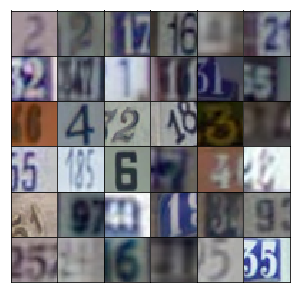

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [54]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [55]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x = tf.layers.dense(z, 4*4*512)
        x= tf.reshape(x, [-1, 4, 4, 512])
        x = tf.layers.batch_normalization(x, training=training)
        x = tf.maximum(alpha*x, x)
        
        x = tf.layers.conv2d_transpose(x, 256, (5,5), strides=(2,2), padding='same')
        x = tf.layers.batch_normalization(x, training=training)
        x = tf.maximum(alpha*x, x)
        
        x = tf.layers.conv2d_transpose(x, 128, (5,5), strides=(2,2), padding='same')
        x = tf.layers.batch_normalization(x, training=training)
        x = tf.maximum(alpha*x, x)
        
        # Output layer, 32x32x3
        logits = tf.layers.conv2d_transpose(x, output_dim, (5,5), strides=(2,2), padding='same')
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [56]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x = tf.layers.conv2d(x, 64, (5,5), strides=(2,2), padding='same')
        x = tf.maximum(x*alpha,x)
        
        x = tf.layers.conv2d(x, 128, (5,5), strides=(2,2), padding='same')
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(x*alpha,x)
    
        x = tf.layers.conv2d(x, 256, (5,5), strides=(2,2), padding='same')
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(x*alpha,x)
        
        logits = tf.layers.dense(tf.reshape(x, [-1,4*4*256]), 1)
        out = tf.nn.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [57]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [58]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [59]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=0.2)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [60]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an errror without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [61]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very senstive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [62]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.002
batch_size = 128
epochs = 10
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

In [63]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/cpu:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 16435265253048749546, name: "/gpu:0"
 device_type: "GPU"
 memory_limit: 312213504
 locality {
   bus_id: 1
 }
 incarnation: 5846498130734704604
 physical_device_desc: "device: 0, name: Tesla K80, pci bus id: 0000:04:00.0"]

Epoch 1/10... Discriminator Loss: 1.1077... Generator Loss: 20.7579
Epoch 1/10... Discriminator Loss: 0.0389... Generator Loss: 6.6633
Epoch 1/10... Discriminator Loss: 2.0102... Generator Loss: 3.2822
Epoch 1/10... Discriminator Loss: 1.7910... Generator Loss: 6.3100
Epoch 1/10... Discriminator Loss: 0.9297... Generator Loss: 0.7765
Epoch 1/10... Discriminator Loss: 0.8256... Generator Loss: 0.9528
Epoch 1/10... Discriminator Loss: 1.4960... Generator Loss: 0.3566
Epoch 1/10... Discriminator Loss: 0.3706... Generator Loss: 1.8357
Epoch 1/10... Discriminator Loss: 0.5230... Generator Loss: 2.2523
Epoch 1/10... Discriminator Loss: 0.6640... Generator Loss: 2.4792


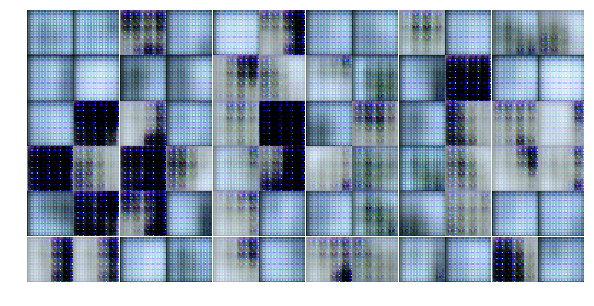

Epoch 1/10... Discriminator Loss: 0.9485... Generator Loss: 0.9184
Epoch 1/10... Discriminator Loss: 0.5900... Generator Loss: 1.1700
Epoch 1/10... Discriminator Loss: 1.2234... Generator Loss: 0.7148
Epoch 1/10... Discriminator Loss: 0.8046... Generator Loss: 1.0198
Epoch 1/10... Discriminator Loss: 6.1740... Generator Loss: 7.0724
Epoch 1/10... Discriminator Loss: 2.2062... Generator Loss: 3.6897
Epoch 1/10... Discriminator Loss: 1.0107... Generator Loss: 2.8696
Epoch 1/10... Discriminator Loss: 0.6756... Generator Loss: 1.5347
Epoch 1/10... Discriminator Loss: 1.2868... Generator Loss: 0.4423
Epoch 1/10... Discriminator Loss: 3.9807... Generator Loss: 4.5337


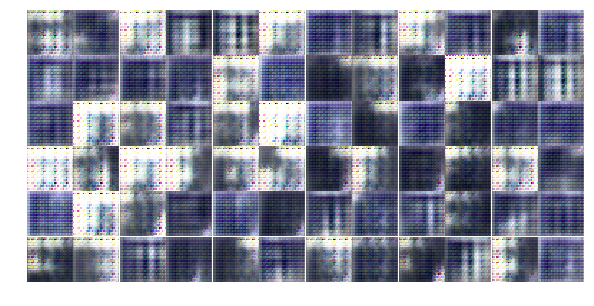

Epoch 1/10... Discriminator Loss: 0.9339... Generator Loss: 0.6396
Epoch 1/10... Discriminator Loss: 1.5692... Generator Loss: 0.5780
Epoch 1/10... Discriminator Loss: 2.1410... Generator Loss: 0.4710
Epoch 1/10... Discriminator Loss: 0.7207... Generator Loss: 0.8749
Epoch 1/10... Discriminator Loss: 0.7285... Generator Loss: 1.5632
Epoch 1/10... Discriminator Loss: 0.3429... Generator Loss: 1.4222
Epoch 1/10... Discriminator Loss: 1.2609... Generator Loss: 4.9196
Epoch 1/10... Discriminator Loss: 1.6527... Generator Loss: 0.5466
Epoch 1/10... Discriminator Loss: 0.9986... Generator Loss: 0.8256
Epoch 1/10... Discriminator Loss: 1.4464... Generator Loss: 0.5439


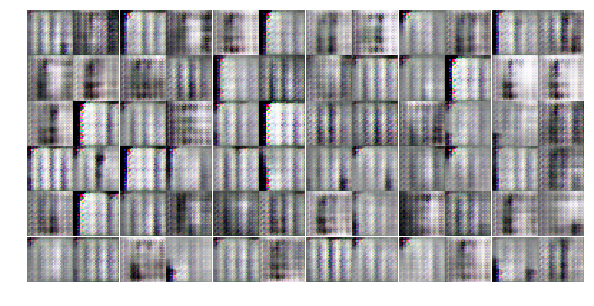

Epoch 1/10... Discriminator Loss: 1.6988... Generator Loss: 0.2803
Epoch 1/10... Discriminator Loss: 1.1918... Generator Loss: 0.8993
Epoch 1/10... Discriminator Loss: 0.8507... Generator Loss: 1.6434
Epoch 1/10... Discriminator Loss: 0.6108... Generator Loss: 2.3417
Epoch 1/10... Discriminator Loss: 0.9386... Generator Loss: 0.7958
Epoch 1/10... Discriminator Loss: 0.6271... Generator Loss: 1.6497
Epoch 1/10... Discriminator Loss: 0.7720... Generator Loss: 1.3865
Epoch 1/10... Discriminator Loss: 1.0911... Generator Loss: 0.7541
Epoch 1/10... Discriminator Loss: 0.8285... Generator Loss: 1.0110
Epoch 1/10... Discriminator Loss: 0.2198... Generator Loss: 2.1311


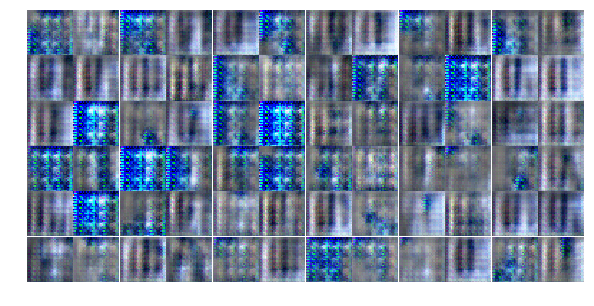

Epoch 1/10... Discriminator Loss: 0.9812... Generator Loss: 0.9844
Epoch 1/10... Discriminator Loss: 1.4138... Generator Loss: 0.9435
Epoch 1/10... Discriminator Loss: 0.6893... Generator Loss: 1.4849
Epoch 1/10... Discriminator Loss: 1.2515... Generator Loss: 0.9272
Epoch 1/10... Discriminator Loss: 0.9803... Generator Loss: 1.2278
Epoch 1/10... Discriminator Loss: 1.1966... Generator Loss: 0.7120
Epoch 1/10... Discriminator Loss: 1.6378... Generator Loss: 1.8462
Epoch 1/10... Discriminator Loss: 0.7353... Generator Loss: 0.9187
Epoch 1/10... Discriminator Loss: 1.5831... Generator Loss: 0.3568
Epoch 1/10... Discriminator Loss: 1.0088... Generator Loss: 1.0793


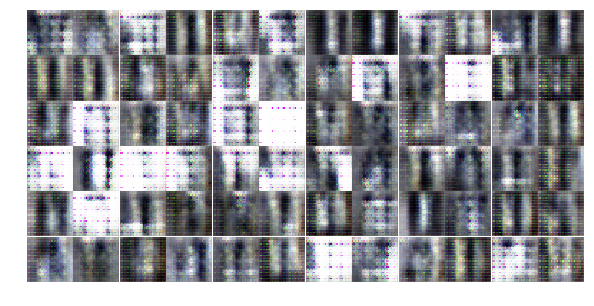

Epoch 1/10... Discriminator Loss: 1.0572... Generator Loss: 1.1844
Epoch 1/10... Discriminator Loss: 0.8178... Generator Loss: 1.2874
Epoch 1/10... Discriminator Loss: 0.4400... Generator Loss: 1.7542
Epoch 1/10... Discriminator Loss: 0.8289... Generator Loss: 0.7960
Epoch 1/10... Discriminator Loss: 0.9861... Generator Loss: 0.6070
Epoch 1/10... Discriminator Loss: 1.1621... Generator Loss: 1.0499
Epoch 1/10... Discriminator Loss: 1.2079... Generator Loss: 0.7036
Epoch 2/10... Discriminator Loss: 2.3177... Generator Loss: 0.1789
Epoch 2/10... Discriminator Loss: 1.0984... Generator Loss: 1.4448
Epoch 2/10... Discriminator Loss: 1.1394... Generator Loss: 0.5661


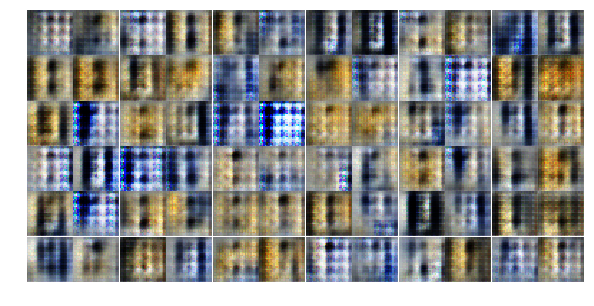

Epoch 2/10... Discriminator Loss: 1.0110... Generator Loss: 0.7566
Epoch 2/10... Discriminator Loss: 0.9386... Generator Loss: 1.7750
Epoch 2/10... Discriminator Loss: 1.2353... Generator Loss: 0.9864
Epoch 2/10... Discriminator Loss: 1.4252... Generator Loss: 1.4715
Epoch 2/10... Discriminator Loss: 1.3411... Generator Loss: 0.4824
Epoch 2/10... Discriminator Loss: 1.1582... Generator Loss: 1.0451
Epoch 2/10... Discriminator Loss: 1.6909... Generator Loss: 1.7138
Epoch 2/10... Discriminator Loss: 1.7527... Generator Loss: 0.5924
Epoch 2/10... Discriminator Loss: 1.3782... Generator Loss: 0.7125
Epoch 2/10... Discriminator Loss: 1.0942... Generator Loss: 1.0164


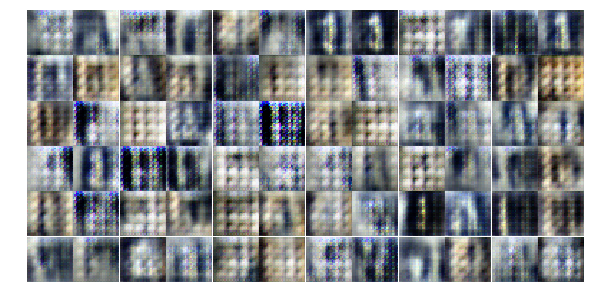

Epoch 2/10... Discriminator Loss: 1.0902... Generator Loss: 0.8063
Epoch 2/10... Discriminator Loss: 0.8722... Generator Loss: 1.0197
Epoch 2/10... Discriminator Loss: 1.1505... Generator Loss: 0.7146
Epoch 2/10... Discriminator Loss: 0.5013... Generator Loss: 2.2039
Epoch 2/10... Discriminator Loss: 0.6745... Generator Loss: 1.4775
Epoch 2/10... Discriminator Loss: 1.4783... Generator Loss: 0.9957
Epoch 2/10... Discriminator Loss: 1.1597... Generator Loss: 0.9280
Epoch 2/10... Discriminator Loss: 1.1160... Generator Loss: 1.0207
Epoch 2/10... Discriminator Loss: 1.0160... Generator Loss: 1.1106
Epoch 2/10... Discriminator Loss: 1.4920... Generator Loss: 0.8036


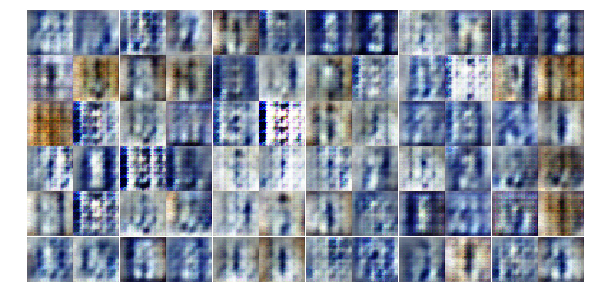

Epoch 2/10... Discriminator Loss: 1.0932... Generator Loss: 1.4373
Epoch 2/10... Discriminator Loss: 1.1963... Generator Loss: 0.5682
Epoch 2/10... Discriminator Loss: 0.7633... Generator Loss: 1.6999
Epoch 2/10... Discriminator Loss: 1.2918... Generator Loss: 1.0947
Epoch 2/10... Discriminator Loss: 1.8548... Generator Loss: 0.7078
Epoch 2/10... Discriminator Loss: 1.1362... Generator Loss: 0.7640
Epoch 2/10... Discriminator Loss: 0.7405... Generator Loss: 2.1299
Epoch 2/10... Discriminator Loss: 0.8070... Generator Loss: 0.7902
Epoch 2/10... Discriminator Loss: 1.2751... Generator Loss: 0.9151
Epoch 2/10... Discriminator Loss: 0.8435... Generator Loss: 1.3388


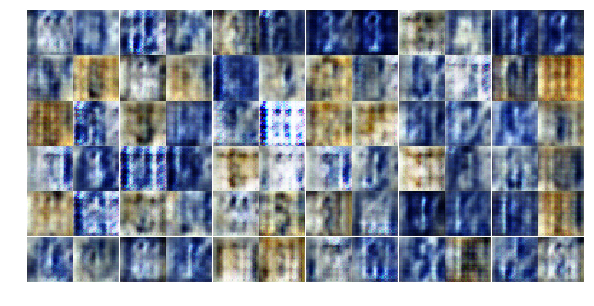

Epoch 2/10... Discriminator Loss: 1.4880... Generator Loss: 0.5240
Epoch 2/10... Discriminator Loss: 2.0432... Generator Loss: 2.0481
Epoch 2/10... Discriminator Loss: 1.2877... Generator Loss: 0.4998
Epoch 2/10... Discriminator Loss: 1.1721... Generator Loss: 1.2827
Epoch 2/10... Discriminator Loss: 1.0115... Generator Loss: 1.1537
Epoch 2/10... Discriminator Loss: 0.9600... Generator Loss: 1.0730
Epoch 2/10... Discriminator Loss: 1.6369... Generator Loss: 0.6593
Epoch 2/10... Discriminator Loss: 1.3075... Generator Loss: 0.8110
Epoch 2/10... Discriminator Loss: 1.6562... Generator Loss: 1.0109
Epoch 2/10... Discriminator Loss: 0.9429... Generator Loss: 0.8489


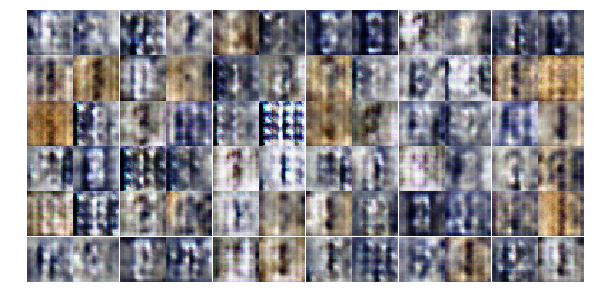

Epoch 2/10... Discriminator Loss: 1.2128... Generator Loss: 1.6345
Epoch 2/10... Discriminator Loss: 1.1987... Generator Loss: 0.9584
Epoch 2/10... Discriminator Loss: 1.2850... Generator Loss: 1.0079
Epoch 2/10... Discriminator Loss: 1.1431... Generator Loss: 0.7560
Epoch 2/10... Discriminator Loss: 1.2684... Generator Loss: 1.3066
Epoch 2/10... Discriminator Loss: 1.0391... Generator Loss: 1.2535
Epoch 2/10... Discriminator Loss: 2.2856... Generator Loss: 2.5761
Epoch 2/10... Discriminator Loss: 1.6859... Generator Loss: 0.6563
Epoch 2/10... Discriminator Loss: 0.8044... Generator Loss: 1.2115
Epoch 2/10... Discriminator Loss: 1.1612... Generator Loss: 0.5882


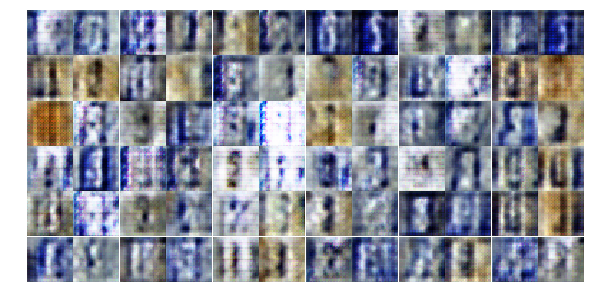

Epoch 2/10... Discriminator Loss: 1.1093... Generator Loss: 2.0890
Epoch 2/10... Discriminator Loss: 1.1893... Generator Loss: 0.6008
Epoch 2/10... Discriminator Loss: 0.9036... Generator Loss: 1.4239
Epoch 2/10... Discriminator Loss: 1.1535... Generator Loss: 0.6792
Epoch 3/10... Discriminator Loss: 1.2050... Generator Loss: 0.9225
Epoch 3/10... Discriminator Loss: 1.1312... Generator Loss: 1.1072
Epoch 3/10... Discriminator Loss: 0.7940... Generator Loss: 1.9449
Epoch 3/10... Discriminator Loss: 0.9251... Generator Loss: 1.1210
Epoch 3/10... Discriminator Loss: 1.4375... Generator Loss: 1.5003
Epoch 3/10... Discriminator Loss: 1.1744... Generator Loss: 0.7906


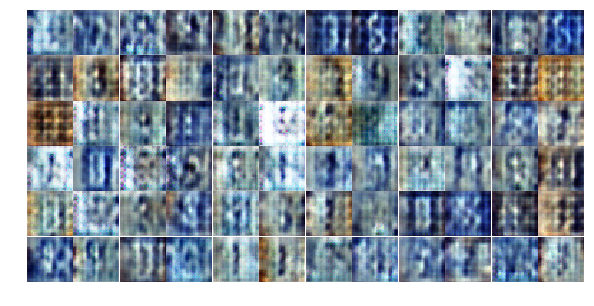

Epoch 3/10... Discriminator Loss: 1.0628... Generator Loss: 1.0093
Epoch 3/10... Discriminator Loss: 1.0308... Generator Loss: 0.8124
Epoch 3/10... Discriminator Loss: 1.1917... Generator Loss: 0.6022
Epoch 3/10... Discriminator Loss: 1.8386... Generator Loss: 3.1527
Epoch 3/10... Discriminator Loss: 0.3562... Generator Loss: 2.7206
Epoch 3/10... Discriminator Loss: 1.0618... Generator Loss: 0.8073
Epoch 3/10... Discriminator Loss: 1.6078... Generator Loss: 0.4371
Epoch 3/10... Discriminator Loss: 1.3937... Generator Loss: 0.6516
Epoch 3/10... Discriminator Loss: 1.5162... Generator Loss: 0.4408
Epoch 3/10... Discriminator Loss: 1.3228... Generator Loss: 0.6262


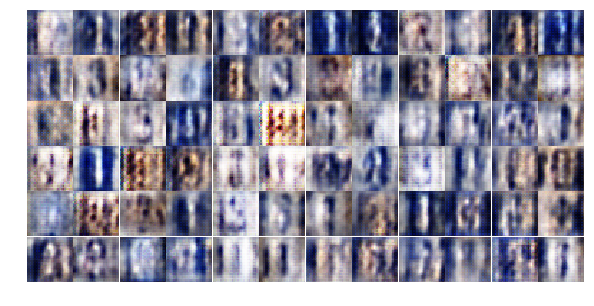

Epoch 3/10... Discriminator Loss: 1.2611... Generator Loss: 0.8098
Epoch 3/10... Discriminator Loss: 0.4263... Generator Loss: 2.1000
Epoch 3/10... Discriminator Loss: 1.4424... Generator Loss: 0.8459
Epoch 3/10... Discriminator Loss: 1.4668... Generator Loss: 1.0514
Epoch 3/10... Discriminator Loss: 1.3119... Generator Loss: 0.7977
Epoch 3/10... Discriminator Loss: 1.1525... Generator Loss: 1.0159
Epoch 3/10... Discriminator Loss: 1.6440... Generator Loss: 0.4743
Epoch 3/10... Discriminator Loss: 1.1664... Generator Loss: 0.7988
Epoch 3/10... Discriminator Loss: 1.4298... Generator Loss: 1.1080
Epoch 3/10... Discriminator Loss: 1.0932... Generator Loss: 0.9247


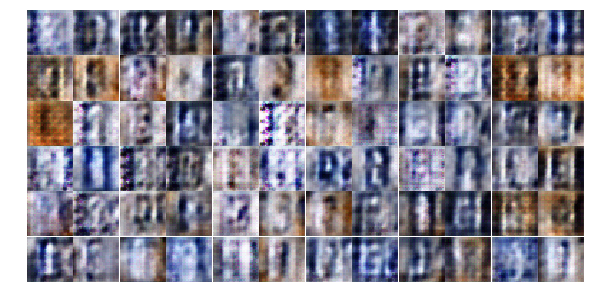

Epoch 3/10... Discriminator Loss: 1.1771... Generator Loss: 0.8420
Epoch 3/10... Discriminator Loss: 1.0993... Generator Loss: 1.4054
Epoch 3/10... Discriminator Loss: 1.4238... Generator Loss: 1.8544
Epoch 3/10... Discriminator Loss: 1.2674... Generator Loss: 1.2499
Epoch 3/10... Discriminator Loss: 1.0861... Generator Loss: 0.7930
Epoch 3/10... Discriminator Loss: 1.7002... Generator Loss: 0.9931
Epoch 3/10... Discriminator Loss: 0.9459... Generator Loss: 0.9711
Epoch 3/10... Discriminator Loss: 0.7832... Generator Loss: 1.0805
Epoch 3/10... Discriminator Loss: 1.3688... Generator Loss: 0.7410
Epoch 3/10... Discriminator Loss: 1.2920... Generator Loss: 0.6962


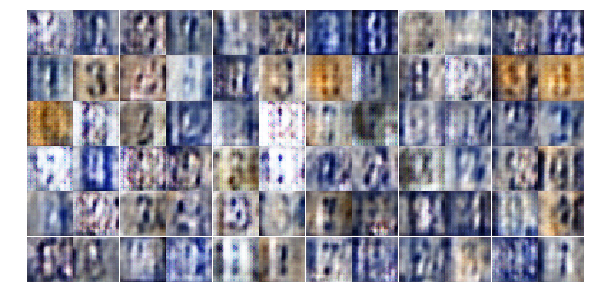

Epoch 3/10... Discriminator Loss: 1.8740... Generator Loss: 1.8915
Epoch 3/10... Discriminator Loss: 1.0540... Generator Loss: 0.6821
Epoch 3/10... Discriminator Loss: 1.1050... Generator Loss: 1.8774
Epoch 3/10... Discriminator Loss: 1.1868... Generator Loss: 0.8646
Epoch 3/10... Discriminator Loss: 0.9464... Generator Loss: 0.9681
Epoch 3/10... Discriminator Loss: 1.1003... Generator Loss: 0.8638
Epoch 3/10... Discriminator Loss: 1.1390... Generator Loss: 0.6679
Epoch 3/10... Discriminator Loss: 0.8653... Generator Loss: 1.2375
Epoch 3/10... Discriminator Loss: 0.8872... Generator Loss: 0.6679
Epoch 3/10... Discriminator Loss: 1.1877... Generator Loss: 1.2434


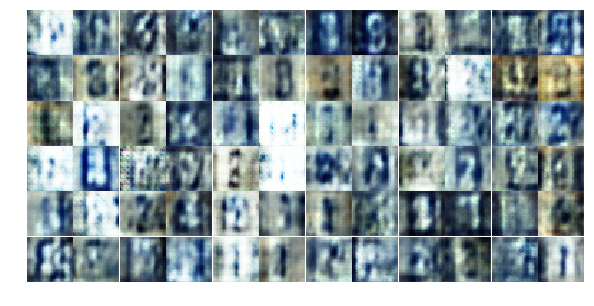

Epoch 3/10... Discriminator Loss: 1.0198... Generator Loss: 1.4303
Epoch 3/10... Discriminator Loss: 1.1812... Generator Loss: 1.6666
Epoch 3/10... Discriminator Loss: 1.4005... Generator Loss: 0.7821
Epoch 3/10... Discriminator Loss: 1.2021... Generator Loss: 0.8672
Epoch 3/10... Discriminator Loss: 1.4106... Generator Loss: 0.8051
Epoch 3/10... Discriminator Loss: 1.1453... Generator Loss: 0.8574
Epoch 3/10... Discriminator Loss: 1.2711... Generator Loss: 0.9309
Epoch 3/10... Discriminator Loss: 1.0311... Generator Loss: 1.1318
Epoch 3/10... Discriminator Loss: 1.1097... Generator Loss: 0.9785
Epoch 3/10... Discriminator Loss: 1.2384... Generator Loss: 0.9421


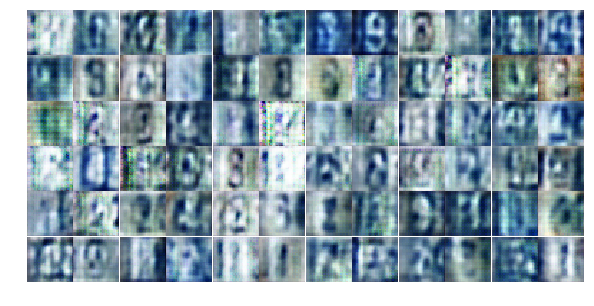

Epoch 3/10... Discriminator Loss: 1.0791... Generator Loss: 0.8599
Epoch 4/10... Discriminator Loss: 1.0861... Generator Loss: 0.9112
Epoch 4/10... Discriminator Loss: 1.1238... Generator Loss: 0.9430
Epoch 4/10... Discriminator Loss: 0.9655... Generator Loss: 0.9541
Epoch 4/10... Discriminator Loss: 1.2775... Generator Loss: 0.5419
Epoch 4/10... Discriminator Loss: 1.3830... Generator Loss: 2.0295
Epoch 4/10... Discriminator Loss: 1.8860... Generator Loss: 0.2150
Epoch 4/10... Discriminator Loss: 1.2825... Generator Loss: 1.1800
Epoch 4/10... Discriminator Loss: 1.0454... Generator Loss: 1.0279
Epoch 4/10... Discriminator Loss: 1.5801... Generator Loss: 0.4304


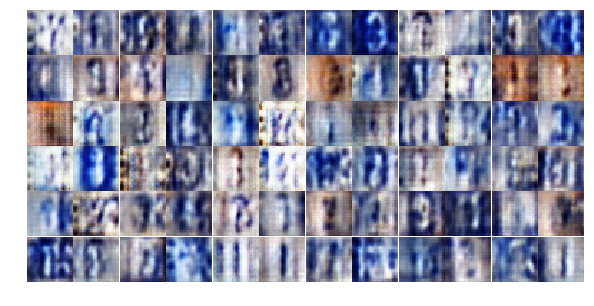

Epoch 4/10... Discriminator Loss: 0.9730... Generator Loss: 1.0135
Epoch 4/10... Discriminator Loss: 1.0868... Generator Loss: 1.1710
Epoch 4/10... Discriminator Loss: 1.1070... Generator Loss: 0.9346
Epoch 4/10... Discriminator Loss: 1.2803... Generator Loss: 1.4468
Epoch 4/10... Discriminator Loss: 1.2847... Generator Loss: 0.6510
Epoch 4/10... Discriminator Loss: 1.3680... Generator Loss: 0.5254
Epoch 4/10... Discriminator Loss: 0.9839... Generator Loss: 1.5821
Epoch 4/10... Discriminator Loss: 1.2706... Generator Loss: 1.3817
Epoch 4/10... Discriminator Loss: 1.1402... Generator Loss: 1.0273
Epoch 4/10... Discriminator Loss: 1.0020... Generator Loss: 1.0380


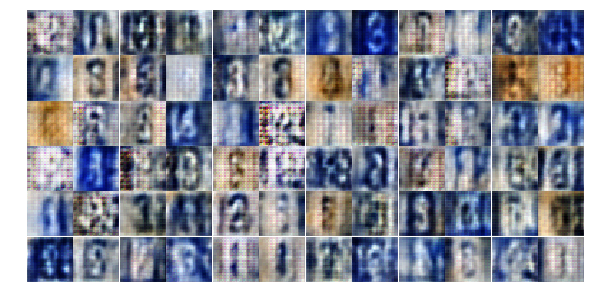

Epoch 4/10... Discriminator Loss: 2.0305... Generator Loss: 0.1970
Epoch 4/10... Discriminator Loss: 0.7047... Generator Loss: 1.8322
Epoch 4/10... Discriminator Loss: 1.0523... Generator Loss: 1.2188
Epoch 4/10... Discriminator Loss: 1.0145... Generator Loss: 0.8510
Epoch 4/10... Discriminator Loss: 1.0080... Generator Loss: 0.8662
Epoch 4/10... Discriminator Loss: 0.4449... Generator Loss: 1.3594
Epoch 4/10... Discriminator Loss: 1.1014... Generator Loss: 0.8679
Epoch 4/10... Discriminator Loss: 1.0584... Generator Loss: 0.9809
Epoch 4/10... Discriminator Loss: 1.1432... Generator Loss: 0.8017
Epoch 4/10... Discriminator Loss: 0.9983... Generator Loss: 0.9531


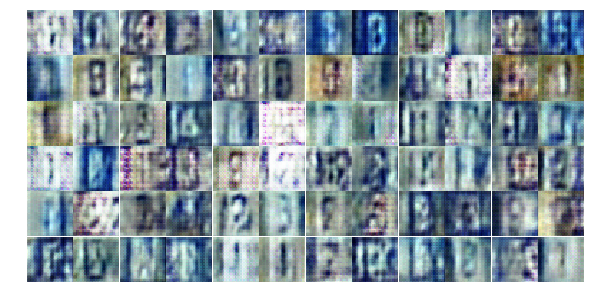

Epoch 4/10... Discriminator Loss: 1.0324... Generator Loss: 1.0017
Epoch 4/10... Discriminator Loss: 0.9383... Generator Loss: 0.8856
Epoch 4/10... Discriminator Loss: 0.4067... Generator Loss: 1.6301
Epoch 4/10... Discriminator Loss: 1.3051... Generator Loss: 3.2825
Epoch 4/10... Discriminator Loss: 1.0316... Generator Loss: 0.8600
Epoch 4/10... Discriminator Loss: 1.0437... Generator Loss: 0.8768
Epoch 4/10... Discriminator Loss: 1.3903... Generator Loss: 0.6418
Epoch 4/10... Discriminator Loss: 1.0348... Generator Loss: 0.7355
Epoch 4/10... Discriminator Loss: 1.2258... Generator Loss: 0.8735
Epoch 4/10... Discriminator Loss: 1.0396... Generator Loss: 1.0791


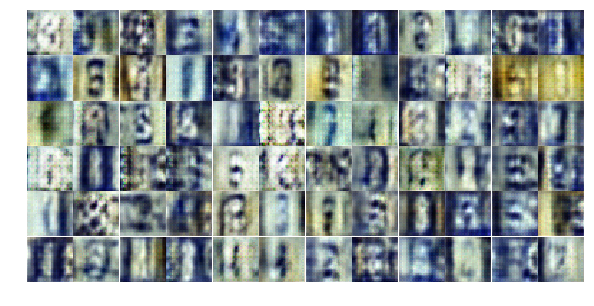

Epoch 4/10... Discriminator Loss: 1.5043... Generator Loss: 0.6520
Epoch 4/10... Discriminator Loss: 1.0743... Generator Loss: 0.6543
Epoch 4/10... Discriminator Loss: 0.9685... Generator Loss: 1.7303
Epoch 4/10... Discriminator Loss: 1.3278... Generator Loss: 0.3801
Epoch 4/10... Discriminator Loss: 0.2157... Generator Loss: 2.1970
Epoch 4/10... Discriminator Loss: 1.2418... Generator Loss: 0.6953
Epoch 4/10... Discriminator Loss: 1.0150... Generator Loss: 1.4112
Epoch 4/10... Discriminator Loss: 1.2902... Generator Loss: 0.9920
Epoch 4/10... Discriminator Loss: 1.1691... Generator Loss: 0.9616
Epoch 4/10... Discriminator Loss: 1.0475... Generator Loss: 0.8987


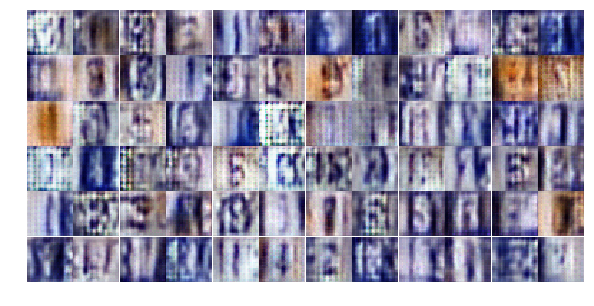

Epoch 4/10... Discriminator Loss: 1.1387... Generator Loss: 0.7502
Epoch 4/10... Discriminator Loss: 1.0369... Generator Loss: 0.9648
Epoch 4/10... Discriminator Loss: 1.0169... Generator Loss: 0.9658
Epoch 4/10... Discriminator Loss: 1.3887... Generator Loss: 0.8831
Epoch 4/10... Discriminator Loss: 1.1198... Generator Loss: 0.5869
Epoch 4/10... Discriminator Loss: 1.2179... Generator Loss: 1.6323
Epoch 4/10... Discriminator Loss: 2.3908... Generator Loss: 3.1005
Epoch 4/10... Discriminator Loss: 1.4525... Generator Loss: 1.8295
Epoch 4/10... Discriminator Loss: 1.1592... Generator Loss: 0.9192
Epoch 5/10... Discriminator Loss: 1.2138... Generator Loss: 1.0866


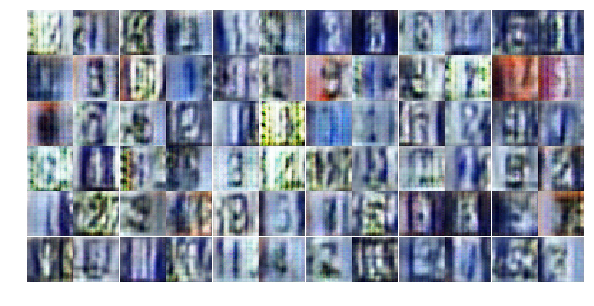

Epoch 5/10... Discriminator Loss: 1.1252... Generator Loss: 0.8562
Epoch 5/10... Discriminator Loss: 1.0986... Generator Loss: 0.8257
Epoch 5/10... Discriminator Loss: 1.2359... Generator Loss: 0.8099
Epoch 5/10... Discriminator Loss: 1.0853... Generator Loss: 1.0882
Epoch 5/10... Discriminator Loss: 1.1585... Generator Loss: 0.8556
Epoch 5/10... Discriminator Loss: 1.1686... Generator Loss: 0.7729
Epoch 5/10... Discriminator Loss: 1.0921... Generator Loss: 1.0922
Epoch 5/10... Discriminator Loss: 1.2151... Generator Loss: 0.9906
Epoch 5/10... Discriminator Loss: 1.2345... Generator Loss: 0.6491
Epoch 5/10... Discriminator Loss: 1.2266... Generator Loss: 0.8244


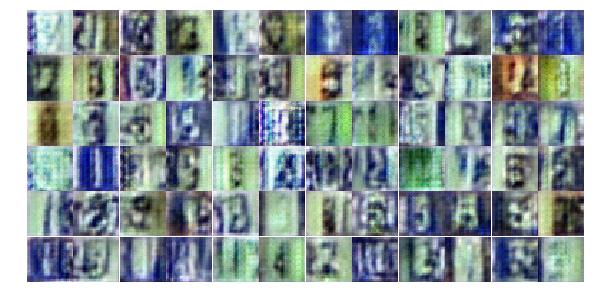

Epoch 5/10... Discriminator Loss: 1.0924... Generator Loss: 0.8516
Epoch 5/10... Discriminator Loss: 1.0734... Generator Loss: 0.9326
Epoch 5/10... Discriminator Loss: 1.0315... Generator Loss: 1.3704
Epoch 5/10... Discriminator Loss: 1.5089... Generator Loss: 0.5942
Epoch 5/10... Discriminator Loss: 1.0536... Generator Loss: 1.5621
Epoch 5/10... Discriminator Loss: 1.3409... Generator Loss: 0.7006
Epoch 5/10... Discriminator Loss: 1.2109... Generator Loss: 0.8303
Epoch 5/10... Discriminator Loss: 0.9291... Generator Loss: 1.3064
Epoch 5/10... Discriminator Loss: 1.0215... Generator Loss: 1.0191
Epoch 5/10... Discriminator Loss: 1.0694... Generator Loss: 0.9833


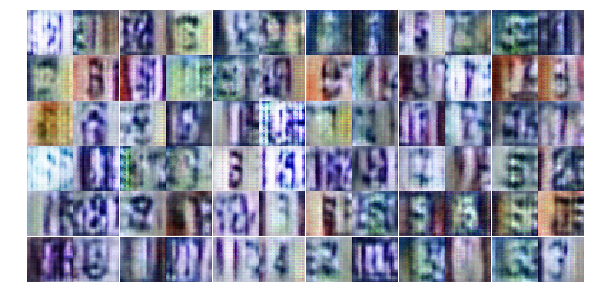

Epoch 5/10... Discriminator Loss: 1.2157... Generator Loss: 1.0279
Epoch 5/10... Discriminator Loss: 1.3143... Generator Loss: 0.6201
Epoch 5/10... Discriminator Loss: 1.3001... Generator Loss: 1.1113
Epoch 5/10... Discriminator Loss: 1.2249... Generator Loss: 0.6934
Epoch 5/10... Discriminator Loss: 1.3701... Generator Loss: 0.4889
Epoch 5/10... Discriminator Loss: 1.0407... Generator Loss: 0.7049
Epoch 5/10... Discriminator Loss: 1.3626... Generator Loss: 0.5378
Epoch 5/10... Discriminator Loss: 1.1747... Generator Loss: 1.2561
Epoch 5/10... Discriminator Loss: 1.1052... Generator Loss: 0.7728
Epoch 5/10... Discriminator Loss: 1.0494... Generator Loss: 1.1237


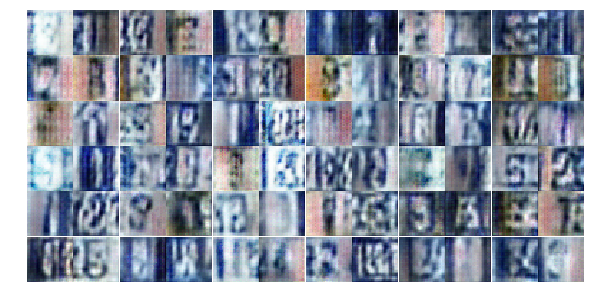

Epoch 5/10... Discriminator Loss: 1.0906... Generator Loss: 1.0021
Epoch 5/10... Discriminator Loss: 1.4541... Generator Loss: 0.7765
Epoch 5/10... Discriminator Loss: 1.0783... Generator Loss: 1.1883
Epoch 5/10... Discriminator Loss: 1.1982... Generator Loss: 0.7631
Epoch 5/10... Discriminator Loss: 1.2454... Generator Loss: 1.1619
Epoch 5/10... Discriminator Loss: 1.0614... Generator Loss: 0.9732
Epoch 5/10... Discriminator Loss: 1.0652... Generator Loss: 0.8629
Epoch 5/10... Discriminator Loss: 1.1170... Generator Loss: 0.8614
Epoch 5/10... Discriminator Loss: 1.0306... Generator Loss: 0.8883
Epoch 5/10... Discriminator Loss: 0.9875... Generator Loss: 1.2762


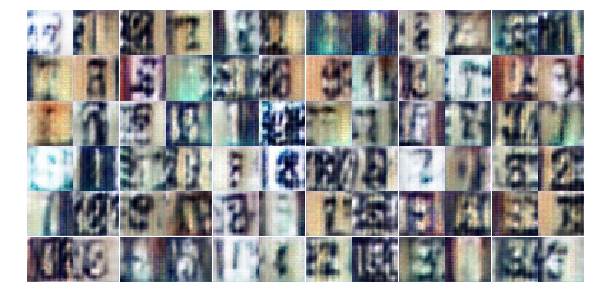

Epoch 5/10... Discriminator Loss: 1.1064... Generator Loss: 1.0583
Epoch 5/10... Discriminator Loss: 1.2387... Generator Loss: 0.5665
Epoch 5/10... Discriminator Loss: 2.0537... Generator Loss: 0.2289
Epoch 5/10... Discriminator Loss: 0.9399... Generator Loss: 1.0190
Epoch 5/10... Discriminator Loss: 1.0760... Generator Loss: 0.7816
Epoch 5/10... Discriminator Loss: 1.2624... Generator Loss: 0.6462
Epoch 5/10... Discriminator Loss: 1.1948... Generator Loss: 0.9096
Epoch 5/10... Discriminator Loss: 1.1274... Generator Loss: 1.0478
Epoch 5/10... Discriminator Loss: 1.3930... Generator Loss: 0.5214
Epoch 5/10... Discriminator Loss: 1.1270... Generator Loss: 0.9276


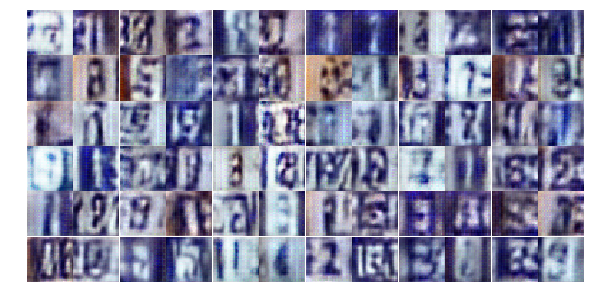

Epoch 5/10... Discriminator Loss: 1.2744... Generator Loss: 0.5904
Epoch 5/10... Discriminator Loss: 1.1111... Generator Loss: 0.8395
Epoch 5/10... Discriminator Loss: 1.0326... Generator Loss: 0.7471
Epoch 5/10... Discriminator Loss: 1.2783... Generator Loss: 0.6593
Epoch 5/10... Discriminator Loss: 1.7120... Generator Loss: 0.3700
Epoch 5/10... Discriminator Loss: 1.2723... Generator Loss: 0.6696
Epoch 6/10... Discriminator Loss: 1.1899... Generator Loss: 0.8073
Epoch 6/10... Discriminator Loss: 1.2955... Generator Loss: 1.1845
Epoch 6/10... Discriminator Loss: 1.1029... Generator Loss: 0.8923
Epoch 6/10... Discriminator Loss: 1.0807... Generator Loss: 0.8582


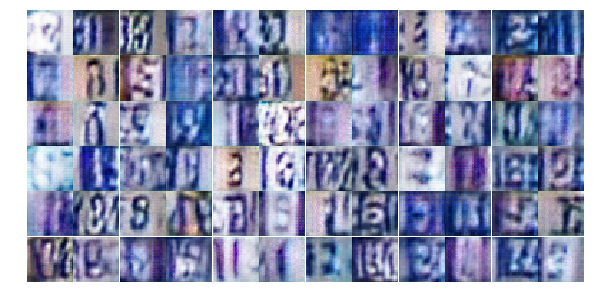

Epoch 6/10... Discriminator Loss: 1.1746... Generator Loss: 0.8264
Epoch 6/10... Discriminator Loss: 1.1105... Generator Loss: 0.9639
Epoch 6/10... Discriminator Loss: 1.0413... Generator Loss: 1.0702
Epoch 6/10... Discriminator Loss: 1.1553... Generator Loss: 0.7641
Epoch 6/10... Discriminator Loss: 1.4349... Generator Loss: 0.5006
Epoch 6/10... Discriminator Loss: 0.9941... Generator Loss: 0.8699
Epoch 6/10... Discriminator Loss: 1.0244... Generator Loss: 1.0405
Epoch 6/10... Discriminator Loss: 1.3645... Generator Loss: 0.6394
Epoch 6/10... Discriminator Loss: 1.0698... Generator Loss: 0.9241
Epoch 6/10... Discriminator Loss: 0.9526... Generator Loss: 1.1579


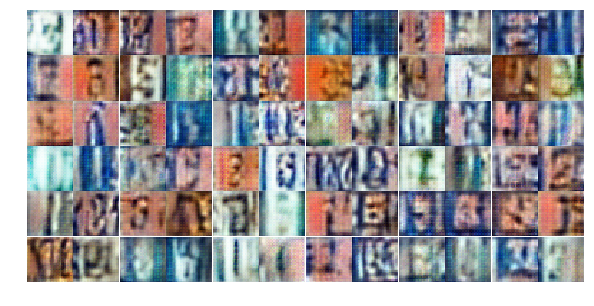

Epoch 6/10... Discriminator Loss: 1.1351... Generator Loss: 1.1986
Epoch 6/10... Discriminator Loss: 1.1954... Generator Loss: 1.0274
Epoch 6/10... Discriminator Loss: 1.4925... Generator Loss: 0.4597
Epoch 6/10... Discriminator Loss: 0.9452... Generator Loss: 1.6274
Epoch 6/10... Discriminator Loss: 1.0572... Generator Loss: 0.8308
Epoch 6/10... Discriminator Loss: 1.1665... Generator Loss: 1.5265
Epoch 6/10... Discriminator Loss: 1.1555... Generator Loss: 0.7767
Epoch 6/10... Discriminator Loss: 1.3304... Generator Loss: 0.7795
Epoch 6/10... Discriminator Loss: 1.1734... Generator Loss: 0.7440
Epoch 6/10... Discriminator Loss: 1.3554... Generator Loss: 0.5796


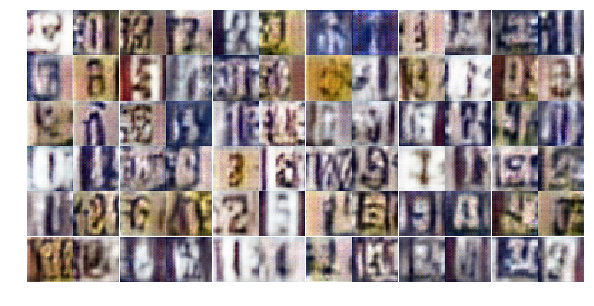

Epoch 6/10... Discriminator Loss: 0.9845... Generator Loss: 0.7987
Epoch 6/10... Discriminator Loss: 1.3792... Generator Loss: 2.0926
Epoch 6/10... Discriminator Loss: 1.1204... Generator Loss: 0.8011
Epoch 6/10... Discriminator Loss: 1.0685... Generator Loss: 0.8816
Epoch 6/10... Discriminator Loss: 0.9998... Generator Loss: 1.5765
Epoch 6/10... Discriminator Loss: 1.1876... Generator Loss: 0.6977
Epoch 6/10... Discriminator Loss: 1.3892... Generator Loss: 0.8310
Epoch 6/10... Discriminator Loss: 1.1348... Generator Loss: 0.8280
Epoch 6/10... Discriminator Loss: 1.2658... Generator Loss: 0.6351
Epoch 6/10... Discriminator Loss: 1.3007... Generator Loss: 0.7505


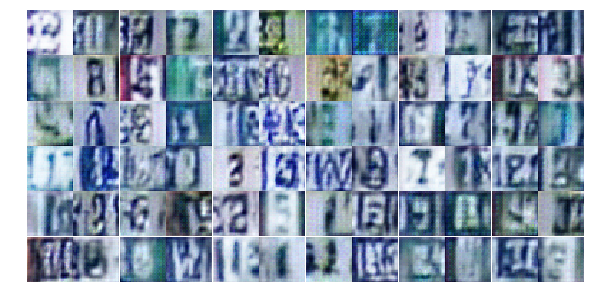

Epoch 6/10... Discriminator Loss: 1.4160... Generator Loss: 0.4730
Epoch 6/10... Discriminator Loss: 0.8859... Generator Loss: 0.9679
Epoch 6/10... Discriminator Loss: 1.3639... Generator Loss: 0.5826
Epoch 6/10... Discriminator Loss: 1.1237... Generator Loss: 0.8469
Epoch 6/10... Discriminator Loss: 0.9819... Generator Loss: 1.0746
Epoch 6/10... Discriminator Loss: 1.2810... Generator Loss: 0.7447
Epoch 6/10... Discriminator Loss: 1.1366... Generator Loss: 0.8022
Epoch 6/10... Discriminator Loss: 1.5676... Generator Loss: 0.3676
Epoch 6/10... Discriminator Loss: 1.3367... Generator Loss: 0.6819
Epoch 6/10... Discriminator Loss: 0.9686... Generator Loss: 0.8305


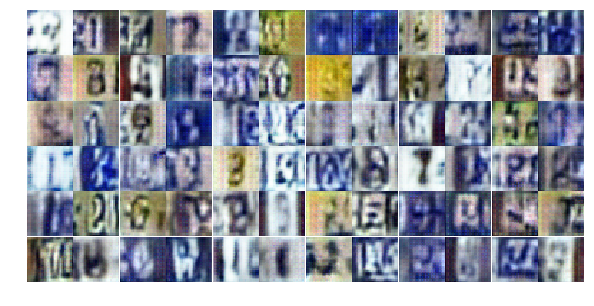

Epoch 6/10... Discriminator Loss: 1.3073... Generator Loss: 0.9070
Epoch 6/10... Discriminator Loss: 1.2668... Generator Loss: 1.1954
Epoch 6/10... Discriminator Loss: 1.2348... Generator Loss: 0.7264
Epoch 6/10... Discriminator Loss: 1.2004... Generator Loss: 0.9277
Epoch 6/10... Discriminator Loss: 1.1949... Generator Loss: 1.0026
Epoch 6/10... Discriminator Loss: 1.0687... Generator Loss: 0.9731
Epoch 6/10... Discriminator Loss: 1.2308... Generator Loss: 0.7199
Epoch 6/10... Discriminator Loss: 1.1650... Generator Loss: 0.7243
Epoch 6/10... Discriminator Loss: 0.9964... Generator Loss: 1.1806
Epoch 6/10... Discriminator Loss: 1.4339... Generator Loss: 0.4693


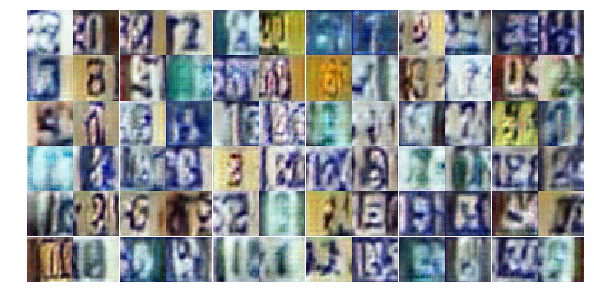

Epoch 6/10... Discriminator Loss: 0.9919... Generator Loss: 1.0071
Epoch 6/10... Discriminator Loss: 1.0289... Generator Loss: 0.9195
Epoch 6/10... Discriminator Loss: 1.0748... Generator Loss: 0.9065
Epoch 7/10... Discriminator Loss: 1.4322... Generator Loss: 1.1743
Epoch 7/10... Discriminator Loss: 1.3898... Generator Loss: 0.6218
Epoch 7/10... Discriminator Loss: 1.1858... Generator Loss: 0.6744
Epoch 7/10... Discriminator Loss: 1.0873... Generator Loss: 0.7991
Epoch 7/10... Discriminator Loss: 1.1267... Generator Loss: 0.7000
Epoch 7/10... Discriminator Loss: 1.1844... Generator Loss: 0.7388
Epoch 7/10... Discriminator Loss: 0.8231... Generator Loss: 1.1091


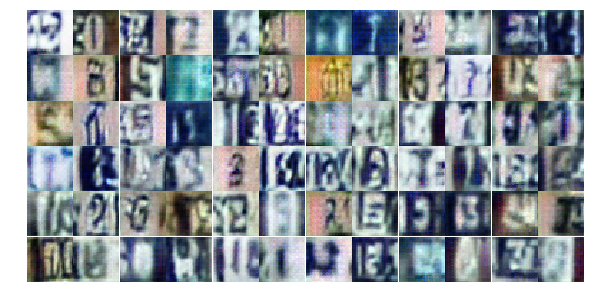

Epoch 7/10... Discriminator Loss: 1.1582... Generator Loss: 1.1616
Epoch 7/10... Discriminator Loss: 1.2915... Generator Loss: 0.5621
Epoch 7/10... Discriminator Loss: 1.1288... Generator Loss: 0.6501
Epoch 7/10... Discriminator Loss: 0.7801... Generator Loss: 0.9643
Epoch 7/10... Discriminator Loss: 0.7366... Generator Loss: 1.0696
Epoch 7/10... Discriminator Loss: 0.7883... Generator Loss: 1.1285
Epoch 7/10... Discriminator Loss: 0.5164... Generator Loss: 1.7094
Epoch 7/10... Discriminator Loss: 1.7090... Generator Loss: 0.3103
Epoch 7/10... Discriminator Loss: 1.4800... Generator Loss: 0.6011
Epoch 7/10... Discriminator Loss: 1.6213... Generator Loss: 0.4180


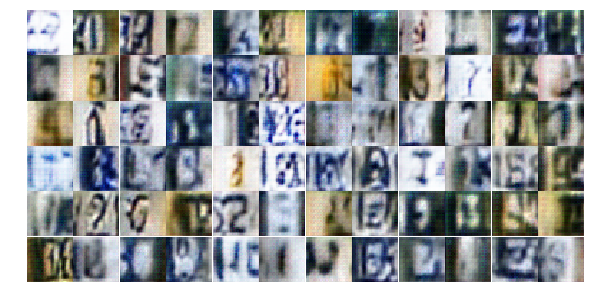

Epoch 7/10... Discriminator Loss: 0.7747... Generator Loss: 1.0316
Epoch 7/10... Discriminator Loss: 1.0897... Generator Loss: 0.9059
Epoch 7/10... Discriminator Loss: 0.9369... Generator Loss: 0.7195
Epoch 7/10... Discriminator Loss: 0.7832... Generator Loss: 1.4964
Epoch 7/10... Discriminator Loss: 0.8083... Generator Loss: 1.1025
Epoch 7/10... Discriminator Loss: 1.2344... Generator Loss: 0.8397
Epoch 7/10... Discriminator Loss: 1.3628... Generator Loss: 0.5899
Epoch 7/10... Discriminator Loss: 1.1175... Generator Loss: 0.7786
Epoch 7/10... Discriminator Loss: 1.1868... Generator Loss: 0.9439
Epoch 7/10... Discriminator Loss: 1.1205... Generator Loss: 1.0300


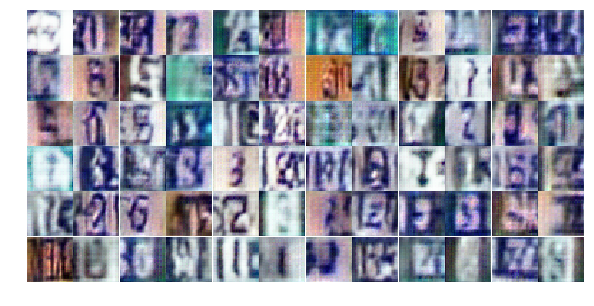

Epoch 7/10... Discriminator Loss: 1.2099... Generator Loss: 0.6750
Epoch 7/10... Discriminator Loss: 1.4647... Generator Loss: 0.4408
Epoch 7/10... Discriminator Loss: 1.0690... Generator Loss: 0.8449
Epoch 7/10... Discriminator Loss: 1.2589... Generator Loss: 0.6922
Epoch 7/10... Discriminator Loss: 1.1456... Generator Loss: 0.7068
Epoch 7/10... Discriminator Loss: 1.0980... Generator Loss: 0.7032
Epoch 7/10... Discriminator Loss: 1.1339... Generator Loss: 0.8708
Epoch 7/10... Discriminator Loss: 1.2590... Generator Loss: 0.6813
Epoch 7/10... Discriminator Loss: 1.5961... Generator Loss: 0.7333
Epoch 7/10... Discriminator Loss: 1.2090... Generator Loss: 0.5524


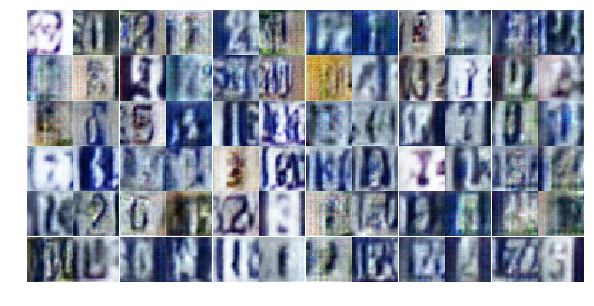

Epoch 7/10... Discriminator Loss: 1.4168... Generator Loss: 0.6057
Epoch 7/10... Discriminator Loss: 0.9322... Generator Loss: 0.7431
Epoch 7/10... Discriminator Loss: 1.0001... Generator Loss: 0.7007
Epoch 7/10... Discriminator Loss: 1.3955... Generator Loss: 1.4314
Epoch 7/10... Discriminator Loss: 0.9911... Generator Loss: 1.1772
Epoch 7/10... Discriminator Loss: 0.9859... Generator Loss: 0.8842
Epoch 7/10... Discriminator Loss: 1.6380... Generator Loss: 0.3789
Epoch 7/10... Discriminator Loss: 1.3452... Generator Loss: 0.5596
Epoch 7/10... Discriminator Loss: 0.8298... Generator Loss: 1.3526
Epoch 7/10... Discriminator Loss: 1.2786... Generator Loss: 0.8068


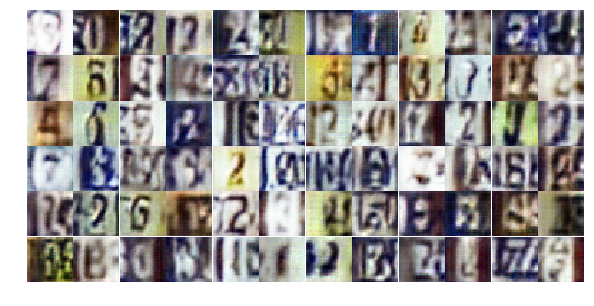

Epoch 7/10... Discriminator Loss: 1.0684... Generator Loss: 0.9007
Epoch 7/10... Discriminator Loss: 1.3092... Generator Loss: 0.5868
Epoch 7/10... Discriminator Loss: 1.2542... Generator Loss: 0.7503
Epoch 7/10... Discriminator Loss: 1.1358... Generator Loss: 0.7449
Epoch 7/10... Discriminator Loss: 1.1179... Generator Loss: 0.6776
Epoch 7/10... Discriminator Loss: 1.3458... Generator Loss: 1.1871
Epoch 7/10... Discriminator Loss: 1.3247... Generator Loss: 0.6304
Epoch 7/10... Discriminator Loss: 1.2597... Generator Loss: 0.5991
Epoch 7/10... Discriminator Loss: 0.9748... Generator Loss: 1.0177
Epoch 7/10... Discriminator Loss: 1.2667... Generator Loss: 2.0332


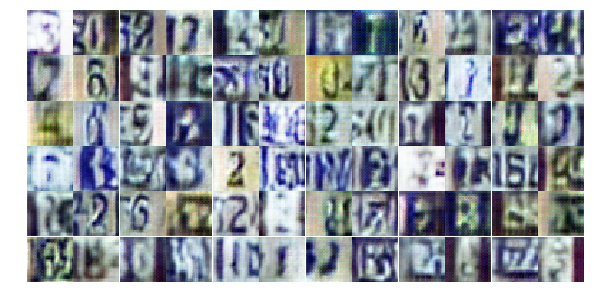

Epoch 7/10... Discriminator Loss: 0.9385... Generator Loss: 1.1319
Epoch 8/10... Discriminator Loss: 0.8566... Generator Loss: 0.8122
Epoch 8/10... Discriminator Loss: 0.6150... Generator Loss: 1.0373
Epoch 8/10... Discriminator Loss: 1.3760... Generator Loss: 0.7251
Epoch 8/10... Discriminator Loss: 1.2200... Generator Loss: 0.7024
Epoch 8/10... Discriminator Loss: 1.3468... Generator Loss: 0.5607
Epoch 8/10... Discriminator Loss: 1.2282... Generator Loss: 0.6525
Epoch 8/10... Discriminator Loss: 1.0964... Generator Loss: 1.0407
Epoch 8/10... Discriminator Loss: 1.1709... Generator Loss: 0.8782
Epoch 8/10... Discriminator Loss: 1.0417... Generator Loss: 1.2199


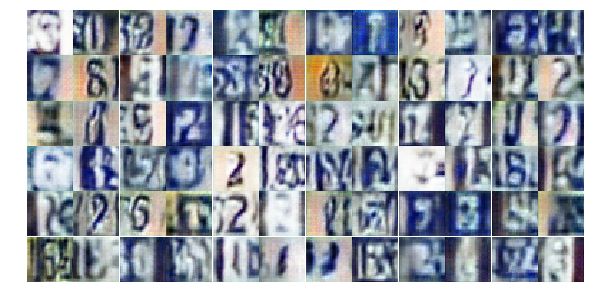

Epoch 8/10... Discriminator Loss: 1.1030... Generator Loss: 1.0007
Epoch 8/10... Discriminator Loss: 0.9758... Generator Loss: 1.0765
Epoch 8/10... Discriminator Loss: 1.5993... Generator Loss: 0.3301
Epoch 8/10... Discriminator Loss: 1.1127... Generator Loss: 0.9029
Epoch 8/10... Discriminator Loss: 1.3567... Generator Loss: 0.4894
Epoch 8/10... Discriminator Loss: 1.0684... Generator Loss: 1.2503
Epoch 8/10... Discriminator Loss: 1.2551... Generator Loss: 0.6699
Epoch 8/10... Discriminator Loss: 1.0016... Generator Loss: 1.1789
Epoch 8/10... Discriminator Loss: 1.1616... Generator Loss: 0.8087
Epoch 8/10... Discriminator Loss: 0.8309... Generator Loss: 2.5837


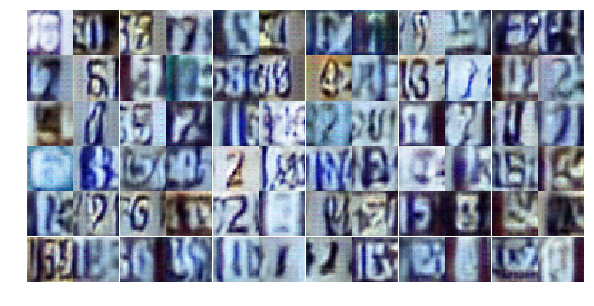

Epoch 8/10... Discriminator Loss: 1.2935... Generator Loss: 0.7264
Epoch 8/10... Discriminator Loss: 0.3517... Generator Loss: 2.9472
Epoch 8/10... Discriminator Loss: 0.3111... Generator Loss: 1.8844
Epoch 8/10... Discriminator Loss: 0.3896... Generator Loss: 1.5539
Epoch 8/10... Discriminator Loss: 1.1377... Generator Loss: 5.3290
Epoch 8/10... Discriminator Loss: 1.0984... Generator Loss: 0.7653
Epoch 8/10... Discriminator Loss: 1.3093... Generator Loss: 0.5762
Epoch 8/10... Discriminator Loss: 1.0397... Generator Loss: 1.0501
Epoch 8/10... Discriminator Loss: 1.1540... Generator Loss: 0.7494
Epoch 8/10... Discriminator Loss: 1.2466... Generator Loss: 0.5346


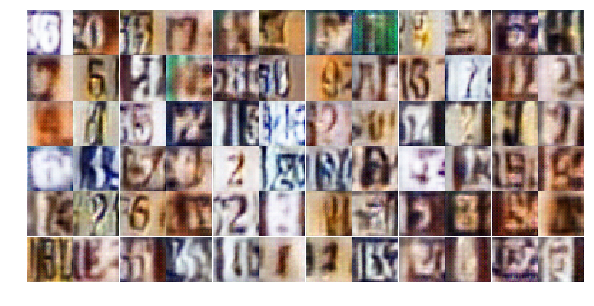

Epoch 8/10... Discriminator Loss: 1.1325... Generator Loss: 0.9934
Epoch 8/10... Discriminator Loss: 0.9867... Generator Loss: 0.8006
Epoch 8/10... Discriminator Loss: 1.2175... Generator Loss: 0.6038
Epoch 8/10... Discriminator Loss: 1.1987... Generator Loss: 0.6654
Epoch 8/10... Discriminator Loss: 1.1763... Generator Loss: 0.6761
Epoch 8/10... Discriminator Loss: 0.9699... Generator Loss: 1.0405
Epoch 8/10... Discriminator Loss: 1.1961... Generator Loss: 0.6505
Epoch 8/10... Discriminator Loss: 1.3725... Generator Loss: 0.5861
Epoch 8/10... Discriminator Loss: 1.2923... Generator Loss: 1.0003
Epoch 8/10... Discriminator Loss: 1.2071... Generator Loss: 0.7366


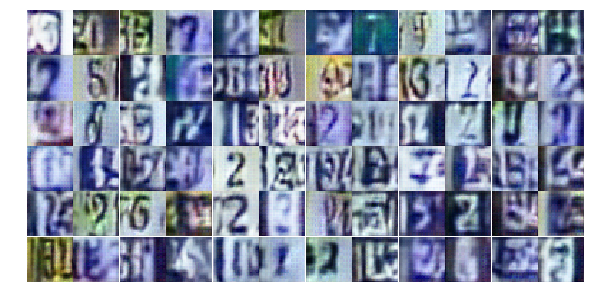

Epoch 8/10... Discriminator Loss: 0.9166... Generator Loss: 1.2908
Epoch 8/10... Discriminator Loss: 1.2673... Generator Loss: 0.5067
Epoch 8/10... Discriminator Loss: 0.9779... Generator Loss: 0.8091
Epoch 8/10... Discriminator Loss: 1.1744... Generator Loss: 1.0202
Epoch 8/10... Discriminator Loss: 1.4405... Generator Loss: 1.6401
Epoch 8/10... Discriminator Loss: 1.1572... Generator Loss: 0.6497
Epoch 8/10... Discriminator Loss: 1.1691... Generator Loss: 0.6139
Epoch 8/10... Discriminator Loss: 1.4619... Generator Loss: 1.2497
Epoch 8/10... Discriminator Loss: 1.1902... Generator Loss: 0.8428
Epoch 8/10... Discriminator Loss: 1.4365... Generator Loss: 0.4475


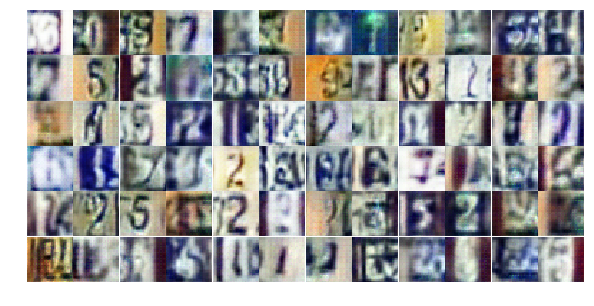

Epoch 8/10... Discriminator Loss: 1.0265... Generator Loss: 1.7079
Epoch 8/10... Discriminator Loss: 1.3545... Generator Loss: 0.5566
Epoch 8/10... Discriminator Loss: 1.2737... Generator Loss: 0.6322
Epoch 8/10... Discriminator Loss: 1.0614... Generator Loss: 1.5389
Epoch 8/10... Discriminator Loss: 0.7919... Generator Loss: 1.4677
Epoch 8/10... Discriminator Loss: 1.1785... Generator Loss: 0.5473
Epoch 8/10... Discriminator Loss: 0.8095... Generator Loss: 0.8546
Epoch 8/10... Discriminator Loss: 1.2574... Generator Loss: 4.1616
Epoch 9/10... Discriminator Loss: 1.0954... Generator Loss: 0.6826
Epoch 9/10... Discriminator Loss: 0.6985... Generator Loss: 2.1577


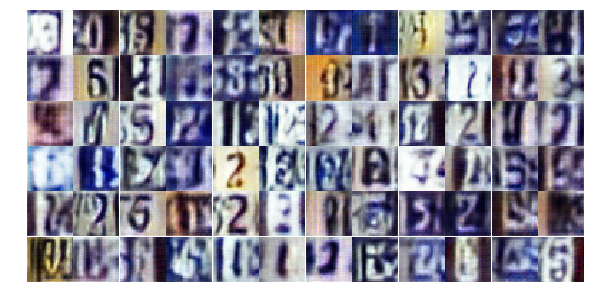

Epoch 9/10... Discriminator Loss: 0.9662... Generator Loss: 0.9054
Epoch 9/10... Discriminator Loss: 1.4703... Generator Loss: 0.4673
Epoch 9/10... Discriminator Loss: 1.2772... Generator Loss: 0.5876
Epoch 9/10... Discriminator Loss: 1.0429... Generator Loss: 0.7461
Epoch 9/10... Discriminator Loss: 0.5799... Generator Loss: 2.3170
Epoch 9/10... Discriminator Loss: 1.2488... Generator Loss: 2.0866
Epoch 9/10... Discriminator Loss: 0.2611... Generator Loss: 2.1704
Epoch 9/10... Discriminator Loss: 1.2148... Generator Loss: 0.7489
Epoch 9/10... Discriminator Loss: 1.4908... Generator Loss: 0.5932
Epoch 9/10... Discriminator Loss: 1.1007... Generator Loss: 0.8761


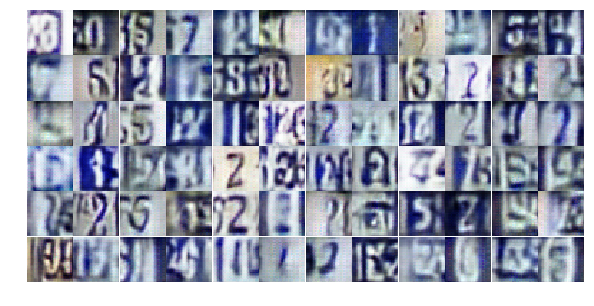

Epoch 9/10... Discriminator Loss: 1.1904... Generator Loss: 0.6094
Epoch 9/10... Discriminator Loss: 1.2484... Generator Loss: 1.6155
Epoch 9/10... Discriminator Loss: 1.0906... Generator Loss: 0.6497
Epoch 9/10... Discriminator Loss: 1.0926... Generator Loss: 0.8947
Epoch 9/10... Discriminator Loss: 0.8763... Generator Loss: 1.4132
Epoch 9/10... Discriminator Loss: 1.1719... Generator Loss: 0.5559
Epoch 9/10... Discriminator Loss: 1.2077... Generator Loss: 0.5753
Epoch 9/10... Discriminator Loss: 0.9066... Generator Loss: 1.1392
Epoch 9/10... Discriminator Loss: 1.4564... Generator Loss: 0.4448
Epoch 9/10... Discriminator Loss: 1.3955... Generator Loss: 0.4413


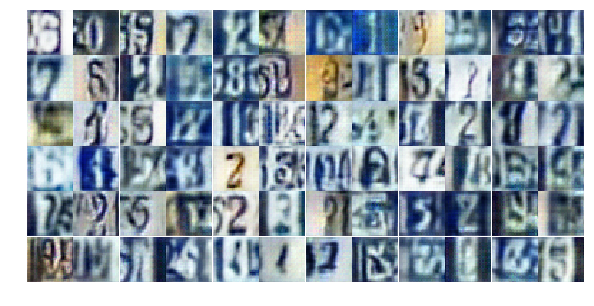

Epoch 9/10... Discriminator Loss: 1.2843... Generator Loss: 0.5428
Epoch 9/10... Discriminator Loss: 1.2197... Generator Loss: 0.4835
Epoch 9/10... Discriminator Loss: 1.3530... Generator Loss: 0.4992
Epoch 9/10... Discriminator Loss: 1.1726... Generator Loss: 0.8048
Epoch 9/10... Discriminator Loss: 1.1910... Generator Loss: 0.6831
Epoch 9/10... Discriminator Loss: 1.0606... Generator Loss: 0.9163
Epoch 9/10... Discriminator Loss: 1.4461... Generator Loss: 0.4439
Epoch 9/10... Discriminator Loss: 1.0135... Generator Loss: 0.9924
Epoch 9/10... Discriminator Loss: 1.1854... Generator Loss: 0.6245
Epoch 9/10... Discriminator Loss: 1.3695... Generator Loss: 0.4372


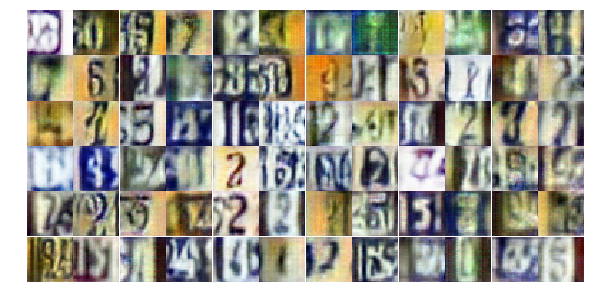

Epoch 9/10... Discriminator Loss: 0.9057... Generator Loss: 1.4222
Epoch 9/10... Discriminator Loss: 1.1502... Generator Loss: 0.5882
Epoch 9/10... Discriminator Loss: 1.0274... Generator Loss: 0.8908
Epoch 9/10... Discriminator Loss: 0.3873... Generator Loss: 2.0741
Epoch 9/10... Discriminator Loss: 0.5989... Generator Loss: 1.3706
Epoch 9/10... Discriminator Loss: 0.4167... Generator Loss: 2.7987
Epoch 9/10... Discriminator Loss: 1.0676... Generator Loss: 1.2822
Epoch 9/10... Discriminator Loss: 0.9248... Generator Loss: 0.9362
Epoch 9/10... Discriminator Loss: 1.5308... Generator Loss: 0.3957
Epoch 9/10... Discriminator Loss: 1.6399... Generator Loss: 0.3151


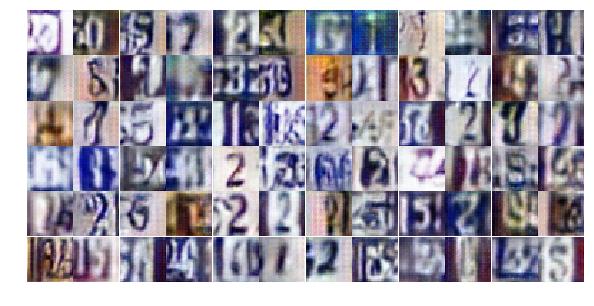

Epoch 9/10... Discriminator Loss: 0.7889... Generator Loss: 1.6788
Epoch 9/10... Discriminator Loss: 1.4581... Generator Loss: 0.4495
Epoch 9/10... Discriminator Loss: 1.0501... Generator Loss: 1.2247
Epoch 9/10... Discriminator Loss: 1.1979... Generator Loss: 0.7564
Epoch 9/10... Discriminator Loss: 0.9784... Generator Loss: 0.8239
Epoch 9/10... Discriminator Loss: 1.2597... Generator Loss: 0.4700
Epoch 9/10... Discriminator Loss: 0.6453... Generator Loss: 1.8443
Epoch 9/10... Discriminator Loss: 1.4485... Generator Loss: 0.5464
Epoch 9/10... Discriminator Loss: 1.0161... Generator Loss: 1.2929
Epoch 9/10... Discriminator Loss: 1.2376... Generator Loss: 0.7156


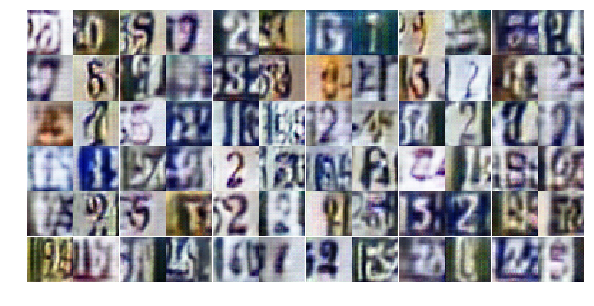

Epoch 9/10... Discriminator Loss: 1.0274... Generator Loss: 0.7937
Epoch 9/10... Discriminator Loss: 0.9759... Generator Loss: 0.7504
Epoch 9/10... Discriminator Loss: 0.9159... Generator Loss: 0.9287
Epoch 9/10... Discriminator Loss: 1.2780... Generator Loss: 0.4929
Epoch 9/10... Discriminator Loss: 1.0190... Generator Loss: 0.7661
Epoch 10/10... Discriminator Loss: 1.0710... Generator Loss: 0.7042
Epoch 10/10... Discriminator Loss: 0.9889... Generator Loss: 0.8780
Epoch 10/10... Discriminator Loss: 1.6290... Generator Loss: 0.3028
Epoch 10/10... Discriminator Loss: 0.9320... Generator Loss: 0.8017
Epoch 10/10... Discriminator Loss: 1.2211... Generator Loss: 0.6746


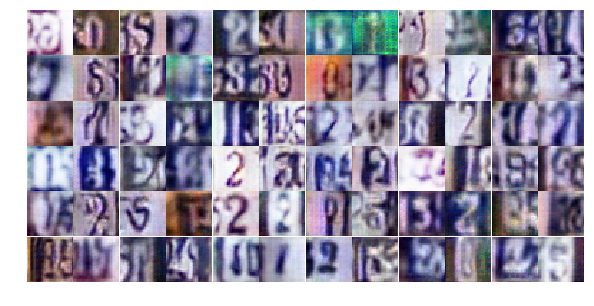

Epoch 10/10... Discriminator Loss: 1.2614... Generator Loss: 0.9953
Epoch 10/10... Discriminator Loss: 0.9676... Generator Loss: 0.9735
Epoch 10/10... Discriminator Loss: 1.7856... Generator Loss: 0.3121
Epoch 10/10... Discriminator Loss: 0.8421... Generator Loss: 1.3315
Epoch 10/10... Discriminator Loss: 1.1353... Generator Loss: 0.7128
Epoch 10/10... Discriminator Loss: 0.9468... Generator Loss: 0.9087
Epoch 10/10... Discriminator Loss: 1.0928... Generator Loss: 0.6018
Epoch 10/10... Discriminator Loss: 0.9511... Generator Loss: 0.8709
Epoch 10/10... Discriminator Loss: 2.4344... Generator Loss: 0.1296
Epoch 10/10... Discriminator Loss: 1.3823... Generator Loss: 0.5919


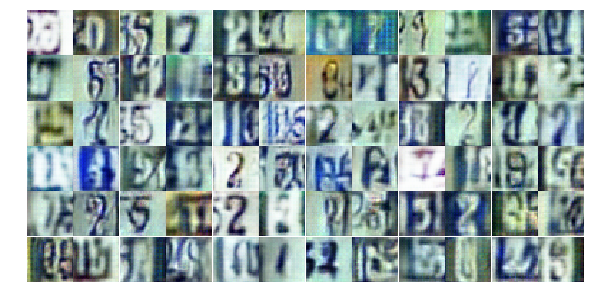

Epoch 10/10... Discriminator Loss: 1.0535... Generator Loss: 0.9649
Epoch 10/10... Discriminator Loss: 1.6126... Generator Loss: 0.3369
Epoch 10/10... Discriminator Loss: 0.8237... Generator Loss: 1.2168
Epoch 10/10... Discriminator Loss: 1.6374... Generator Loss: 0.3363
Epoch 10/10... Discriminator Loss: 0.9122... Generator Loss: 1.1500
Epoch 10/10... Discriminator Loss: 0.8274... Generator Loss: 0.8997
Epoch 10/10... Discriminator Loss: 1.3937... Generator Loss: 0.4850
Epoch 10/10... Discriminator Loss: 1.1685... Generator Loss: 0.6085
Epoch 10/10... Discriminator Loss: 1.1763... Generator Loss: 0.7530
Epoch 10/10... Discriminator Loss: 0.6209... Generator Loss: 1.5897


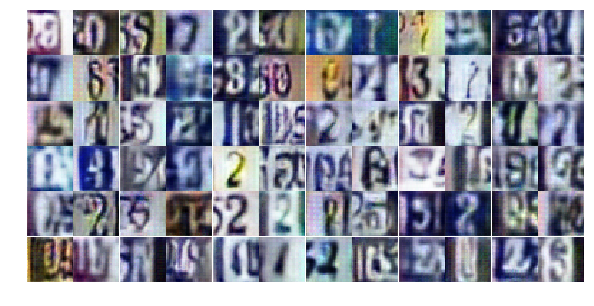

Epoch 10/10... Discriminator Loss: 1.3502... Generator Loss: 0.6018
Epoch 10/10... Discriminator Loss: 1.6337... Generator Loss: 0.3918
Epoch 10/10... Discriminator Loss: 1.0573... Generator Loss: 1.2445
Epoch 10/10... Discriminator Loss: 0.9765... Generator Loss: 0.9048
Epoch 10/10... Discriminator Loss: 1.3721... Generator Loss: 0.4626
Epoch 10/10... Discriminator Loss: 1.1058... Generator Loss: 0.6659
Epoch 10/10... Discriminator Loss: 0.1259... Generator Loss: 2.7309
Epoch 10/10... Discriminator Loss: 1.4175... Generator Loss: 0.4470
Epoch 10/10... Discriminator Loss: 1.1519... Generator Loss: 0.5815
Epoch 10/10... Discriminator Loss: 0.9882... Generator Loss: 0.9452


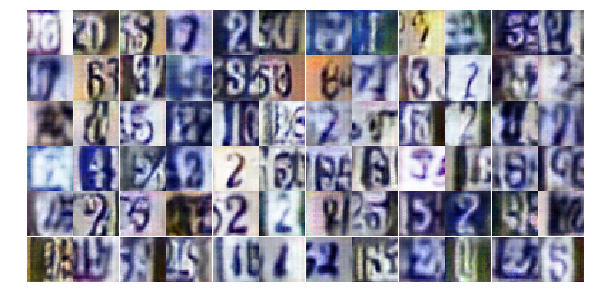

Epoch 10/10... Discriminator Loss: 1.6562... Generator Loss: 2.4849
Epoch 10/10... Discriminator Loss: 1.4872... Generator Loss: 0.4844
Epoch 10/10... Discriminator Loss: 1.1757... Generator Loss: 0.7320
Epoch 10/10... Discriminator Loss: 1.0869... Generator Loss: 1.0835
Epoch 10/10... Discriminator Loss: 1.1826... Generator Loss: 0.6453
Epoch 10/10... Discriminator Loss: 1.3381... Generator Loss: 0.4815
Epoch 10/10... Discriminator Loss: 1.1978... Generator Loss: 0.6100
Epoch 10/10... Discriminator Loss: 0.4652... Generator Loss: 1.6284
Epoch 10/10... Discriminator Loss: 0.6091... Generator Loss: 1.1918
Epoch 10/10... Discriminator Loss: 2.3337... Generator Loss: 0.2023


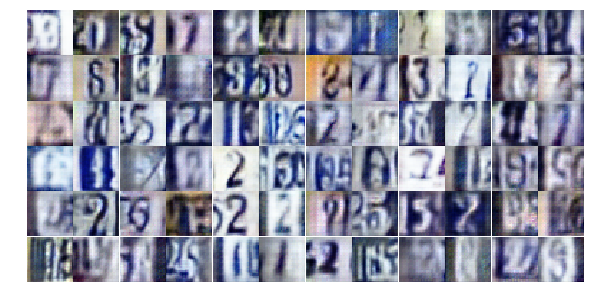

Epoch 10/10... Discriminator Loss: 2.1996... Generator Loss: 0.3200
Epoch 10/10... Discriminator Loss: 0.8893... Generator Loss: 1.0059
Epoch 10/10... Discriminator Loss: 1.5375... Generator Loss: 0.4273
Epoch 10/10... Discriminator Loss: 1.4245... Generator Loss: 0.4037
Epoch 10/10... Discriminator Loss: 0.5040... Generator Loss: 5.2032
Epoch 10/10... Discriminator Loss: 1.2852... Generator Loss: 0.9734
Epoch 10/10... Discriminator Loss: 1.2235... Generator Loss: 0.9130
Epoch 10/10... Discriminator Loss: 1.1192... Generator Loss: 0.9392
Epoch 10/10... Discriminator Loss: 1.0114... Generator Loss: 0.9132
Epoch 10/10... Discriminator Loss: 0.9408... Generator Loss: 0.9845


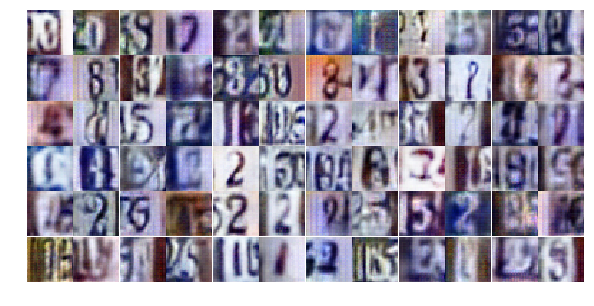

Epoch 10/10... Discriminator Loss: 0.9248... Generator Loss: 1.1391
Epoch 10/10... Discriminator Loss: 1.0740... Generator Loss: 0.7223
Epoch 10/10... Discriminator Loss: 0.9326... Generator Loss: 0.9583


In [64]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

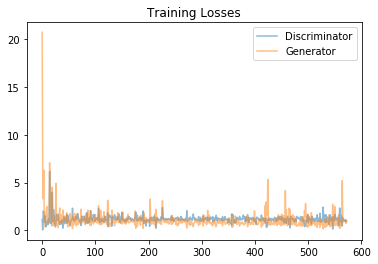

In [65]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

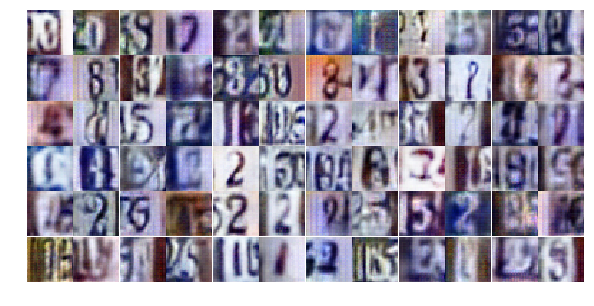

In [66]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))